In [2]:
!pip install numpy

  Using cached numpy-1.24.3-cp310-cp310-win_amd64.whl (14.8 MB)


In [3]:
!pip install pandas

  Using cached pandas-2.0.2-cp310-cp310-win_amd64.whl (10.7 MB)
  Using cached tzdata-2023.3-py2.py3-none-any.whl (341 kB)


In [4]:
!pip install matplotlib

  Using cached matplotlib-3.7.1-cp310-cp310-win_amd64.whl (7.6 MB)
  Using cached fonttools-4.40.0-cp310-cp310-win_amd64.whl (1.9 MB)
  Using cached contourpy-1.0.7-cp310-cp310-win_amd64.whl (162 kB)
  Using cached cycler-0.11.0-py3-none-any.whl (6.4 kB)
  Using cached Pillow-9.5.0-cp310-cp310-win_amd64.whl (2.5 MB)
  Using cached pyparsing-3.0.9-py3-none-any.whl (98 kB)
  Using cached kiwisolver-1.4.4-cp310-cp310-win_amd64.whl (55 kB)


In [ ]:
!pip install tensorflow

In [10]:
!pip install keras

     ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
     -- ------------------------------------- 0.1/1.7 MB 3.6 MB/s eta 0:00:01
     -------- ------------------------------- 0.3/1.7 MB 5.5 MB/s eta 0:00:01
     ----------------- ---------------------- 0.8/1.7 MB 6.0 MB/s eta 0:00:01
     ------------------------------- -------- 1.4/1.7 MB 7.2 MB/s eta 0:00:01
     ---------------------------------------- 1.7/1.7 MB 7.4 MB/s eta 0:00:00


In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

import tensorflow

from keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16, VGG19, InceptionV3, Xception, ResNet50
from keras.models import Model
from keras.layers import Dense, Flatten
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Директории для тренировочных и тестовых изображений
train_dir = "./train/"
test_dir = "./test1/"


# Задаем размер и каналы изображения
IMAGE_WIDTH=128
IMAGE_HEIGHT=128
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=3

# Создание DataFrame, в котором хранится информация о каждом изображении
filenames = os.listdir(train_dir)
categories = []
for filename in filenames:
    category = filename.split('.')[0]
    categories.append(category)

df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})

# Создание генератора изображений с нормализацией и разделением на обучающую и валидационную выборку
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = train_datagen.flow_from_dataframe(
    df,
    train_dir,
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='binary',
    batch_size=20,
    subset='training')

validation_generator = train_datagen.flow_from_dataframe(
    df,
    train_dir,
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='binary',
    batch_size=20,
    subset='validation')

Found 20000 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


In [2]:
# Функция для создания, обучения и оценки модели
def create_fit_evaluate_model(base_model, model_name):
    # Заморозка весов базовой модели
    base_model.trainable = False

    # Добавление слоев Flatten и Dense к базовой модели
    model = Model(inputs=base_model.input, outputs=Dense(1, activation='sigmoid')(Flatten()(base_model.output)))

    # Компиляция модели
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Определение функций обратного вызова для ранней остановки обучения и сохранения лучшей модели
    earlystop = EarlyStopping(patience=10)
    callbacks = [earlystop, ModelCheckpoint(filepath=f'model_{model_name}.h5', save_best_only=True)]

    # Обучение модели
    history = model.fit(train_generator, validation_data=validation_generator, epochs=3, callbacks=callbacks)

    # Построение графиков потерь и точности для обучающего и валидационного наборов данных
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
    ax1.plot(history.history['loss'], color='b', label="Тренировочные потери")
    ax1.plot(history.history['val_loss'], color='r', label="Валидационные потери")
    ax1.set_xticks(np.arange(1, len(history.history['loss']), 1))
    ax1.set_yticks(np.arange(0, max(history.history['loss']), 0.1))
    ax1.legend()

    ax2.plot(history.history['accuracy'], color='b', label="Тренировочная точность")
    ax2.plot(history.history['val_accuracy'], color='r',label="Валидационная точность")
    ax2.set_xticks(np.arange(1, len(history.history['accuracy']), 1))
    ax2.legend()

    plt.tight_layout()
    plt.show()

    print(f'Лучшая валидационная точность для {model_name}: ', max(history.history['val_accuracy']))


In [3]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

Обучение модели vgg16...
Epoch 1/3
1000/1000 [==============================] - 509s 509ms/step - loss: 0.2840 - accuracy: 0.8747 - val_loss: 0.1636 - val_accuracy: 0.9390
Epoch 2/3
1000/1000 [==============================] - 486s 486ms/step - loss: 0.2185 - accuracy: 0.9056 - val_loss: 0.1912 - val_accuracy: 0.9260
Epoch 3/3
1000/1000 [==============================] - 484s 485ms/step - loss: 0.1945 - accuracy: 0.9183 - val_loss: 0.2367 - val_accuracy: 0.9066


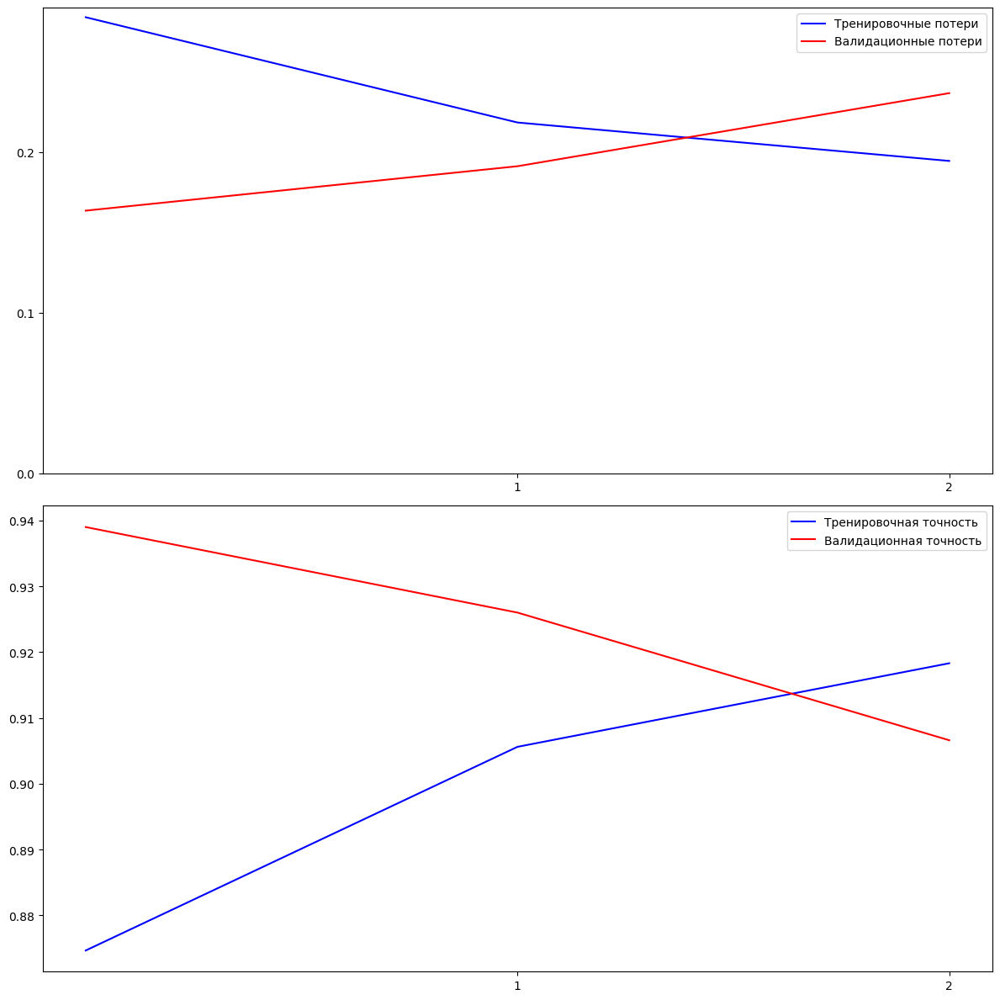

Лучшая валидационная точность для vgg16:  0.9390000104904175


In [5]:
# Применение функции для модели vgg16
base_models = {
    "vgg16": VGG16
}

for model_name, base_model in base_models.items():
    print(f'Обучение модели {model_name}...')
    base_model = base_model(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS))

    create_fit_evaluate_model(base_model, model_name)

In [7]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [8]:
# Функция для подготовки изображения и выполнения предсказания
def predict_image(model, img_path):
    img = image.load_img(img_path, target_size=(128, 128))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.
    prediction = model.predict(img_tensor)
    return prediction

1/1 [==============================] - 0s 47ms/step


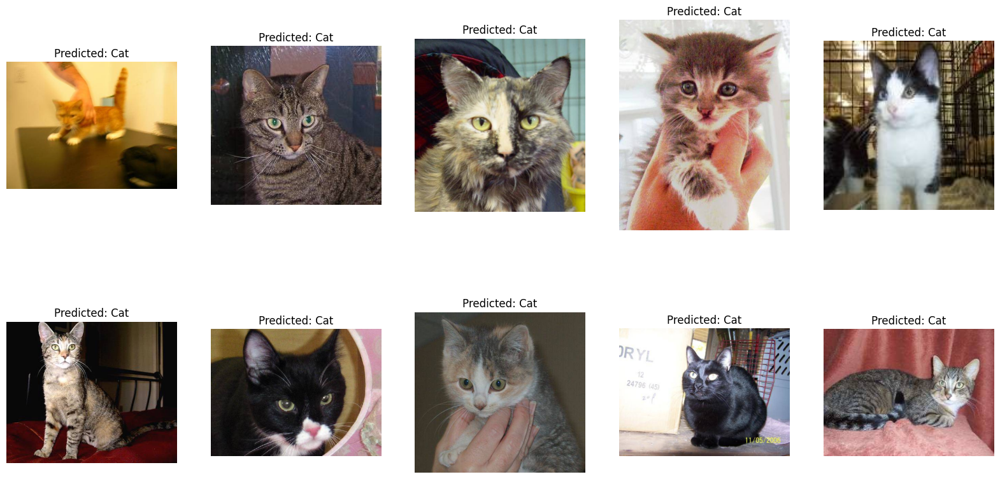

1/1 [==============================] - 0s 63ms/step


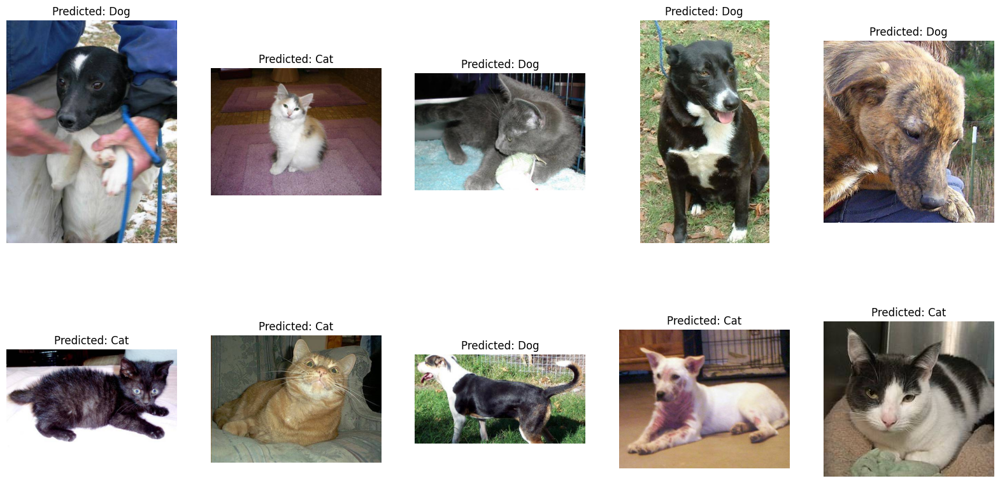

In [9]:
model = load_model('model_vgg16.h5')

# Директории для изображений
dirs = [train_dir, test_dir]

for dir in dirs:
    plt.figure(figsize=(20, 10))
    for i, img_file in enumerate(os.listdir(dir)[:10]):
        img_path = os.path.join(dir, img_file)
        prediction = predict_image(model, img_path)

        img = mpimg.imread(img_path)
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {"Cat" if prediction < 0.5 else "Dog"}')
    plt.show()

Обучение модели vgg19...
Epoch 1/3
1000/1000 [==============================] - 623s 623ms/step - loss: 0.3338 - accuracy: 0.8498 - val_loss: 0.6290 - val_accuracy: 0.7116
Epoch 2/3
1000/1000 [==============================] - 591s 591ms/step - loss: 0.2584 - accuracy: 0.8877 - val_loss: 0.2961 - val_accuracy: 0.8756
Epoch 3/3
1000/1000 [==============================] - 592s 592ms/step - loss: 0.2337 - accuracy: 0.9009 - val_loss: 0.4193 - val_accuracy: 0.8200


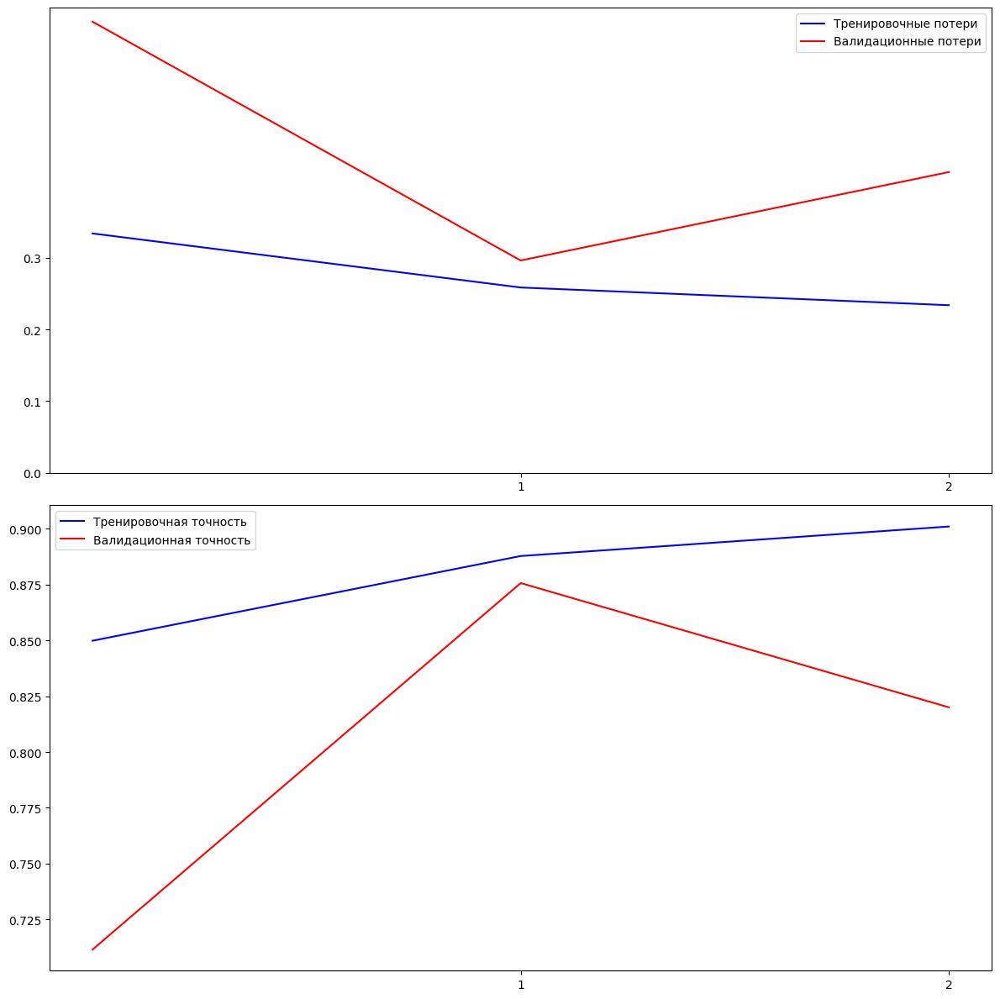

Лучшая валидационная точность для vgg19:  0.8755999803543091


In [6]:
# Применение функции для модели vgg19
base_models = {
    "vgg19": VGG19
}

for model_name, base_model in base_models.items():
    print(f'Обучение модели {model_name}...')
    base_model = base_model(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS))

    create_fit_evaluate_model(base_model, model_name)

1/1 [==============================] - 0s 63ms/step


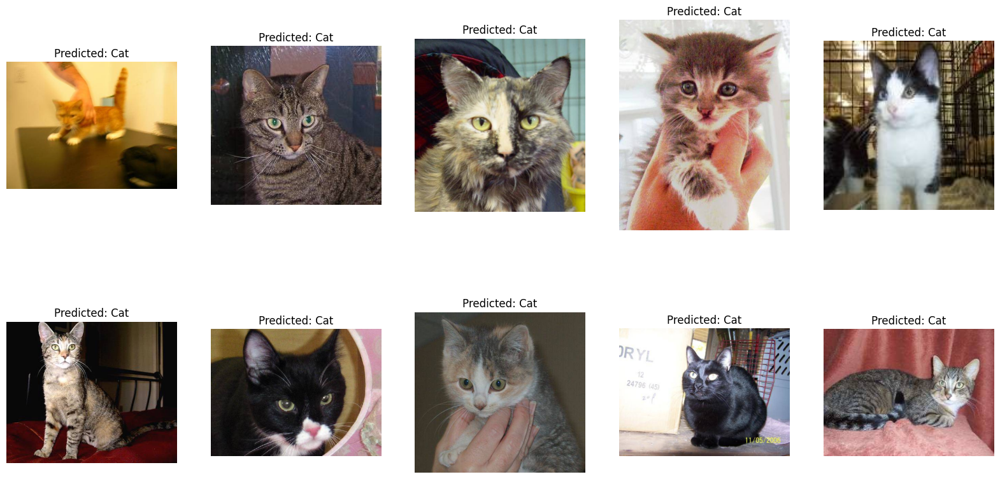

1/1 [==============================] - 0s 67ms/step


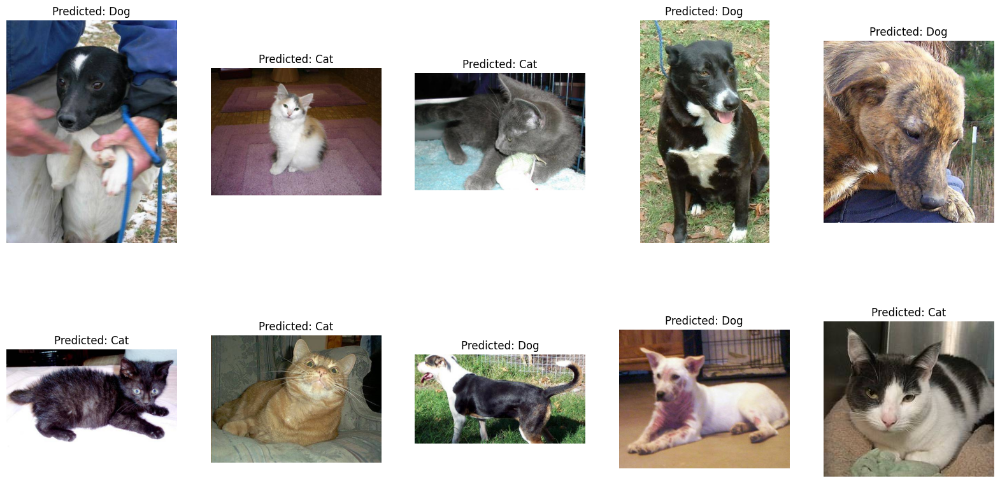

In [9]:
model = load_model('model_vgg19.h5')

# Директории для изображений
dirs = [train_dir, test_dir]

for dir in dirs:
    plt.figure(figsize=(20, 10))
    for i, img_file in enumerate(os.listdir(dir)[:10]):
        img_path = os.path.join(dir, img_file)
        prediction = predict_image(model, img_path)

        img = mpimg.imread(img_path)
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {"Cat" if prediction < 0.5 else "Dog"}')
    plt.show()

Обучение модели inception...
87910968/87910968 [==============================] - 8s 0us/step
Epoch 1/3
1000/1000 [==============================] - 174s 170ms/step - loss: 0.3592 - accuracy: 0.9161 - val_loss: 0.2289 - val_accuracy: 0.9514
Epoch 2/3
1000/1000 [==============================] - 119s 119ms/step - loss: 0.3147 - accuracy: 0.9348 - val_loss: 0.7869 - val_accuracy: 0.8666
Epoch 3/3
1000/1000 [==============================] - 115s 115ms/step - loss: 0.2635 - accuracy: 0.9435 - val_loss: 0.4172 - val_accuracy: 0.9226


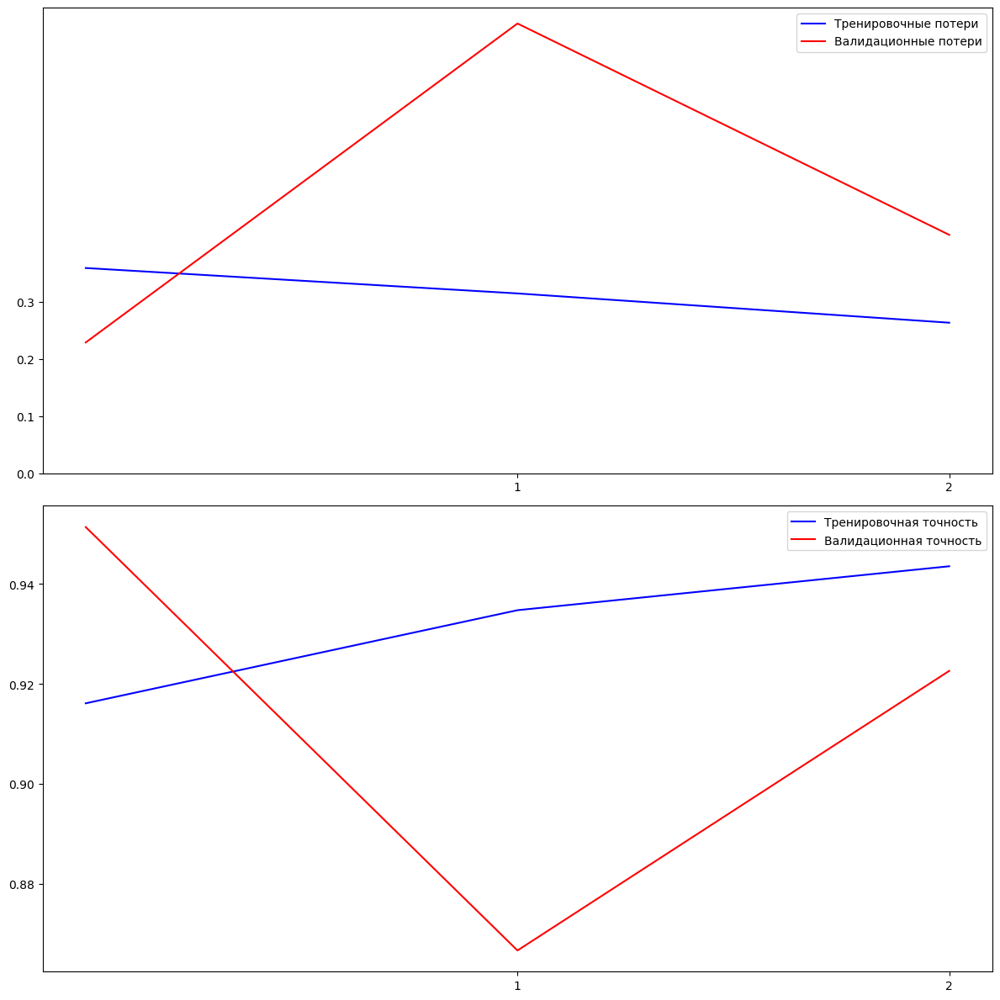

Лучшая валидационная точность для inception:  0.9513999819755554


In [10]:
# Применение функции для модели inception
base_models = {
    "inception": InceptionV3
}

for model_name, base_model in base_models.items():
    print(f'Обучение модели {model_name}...')
    base_model = base_model(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS))

    create_fit_evaluate_model(base_model, model_name)

1/1 [==============================] - 0s 39ms/step


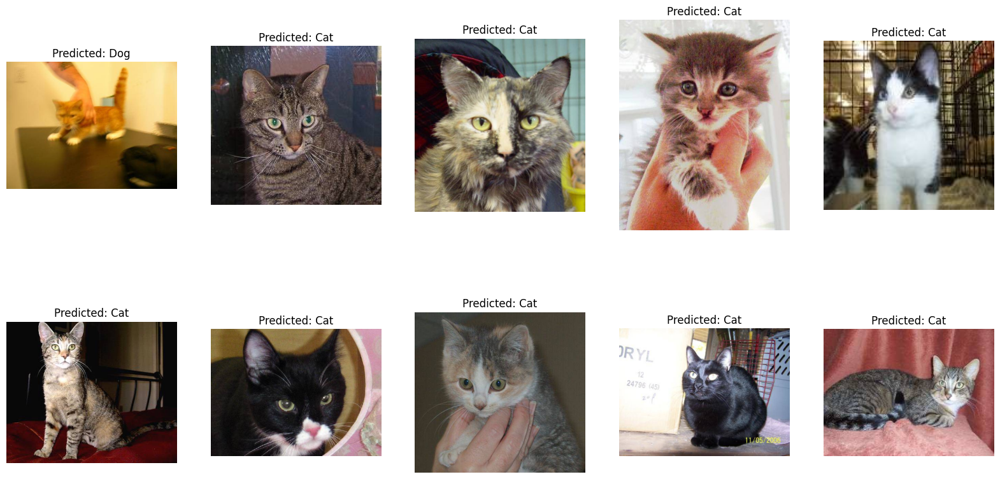

1/1 [==============================] - 0s 47ms/step


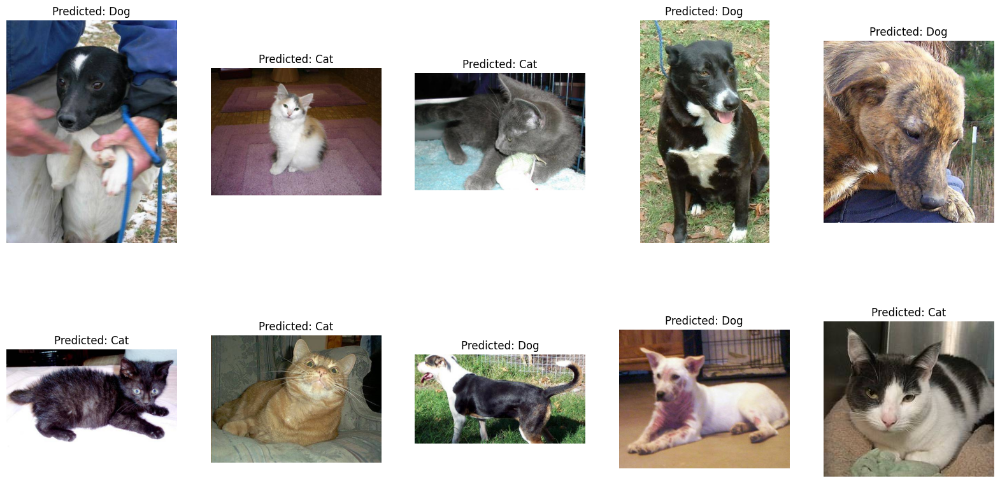

In [11]:
model = load_model('model_inception.h5')

# Директории для изображений
dirs = [train_dir, test_dir]

for dir in dirs:
    plt.figure(figsize=(20, 10))
    for i, img_file in enumerate(os.listdir(dir)[:10]):
        img_path = os.path.join(dir, img_file)
        prediction = predict_image(model, img_path)

        img = mpimg.imread(img_path)
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {"Cat" if prediction < 0.5 else "Dog"}')
    plt.show()

Обучение модели xception...
Epoch 1/3
1000/1000 [==============================] - 249s 246ms/step - loss: 0.3898 - accuracy: 0.9315 - val_loss: 0.8097 - val_accuracy: 0.8752
Epoch 2/3
1000/1000 [==============================] - 256s 257ms/step - loss: 0.3566 - accuracy: 0.9452 - val_loss: 0.3361 - val_accuracy: 0.9534
Epoch 3/3
1000/1000 [==============================] - 256s 256ms/step - loss: 0.3211 - accuracy: 0.9519 - val_loss: 0.7510 - val_accuracy: 0.9078


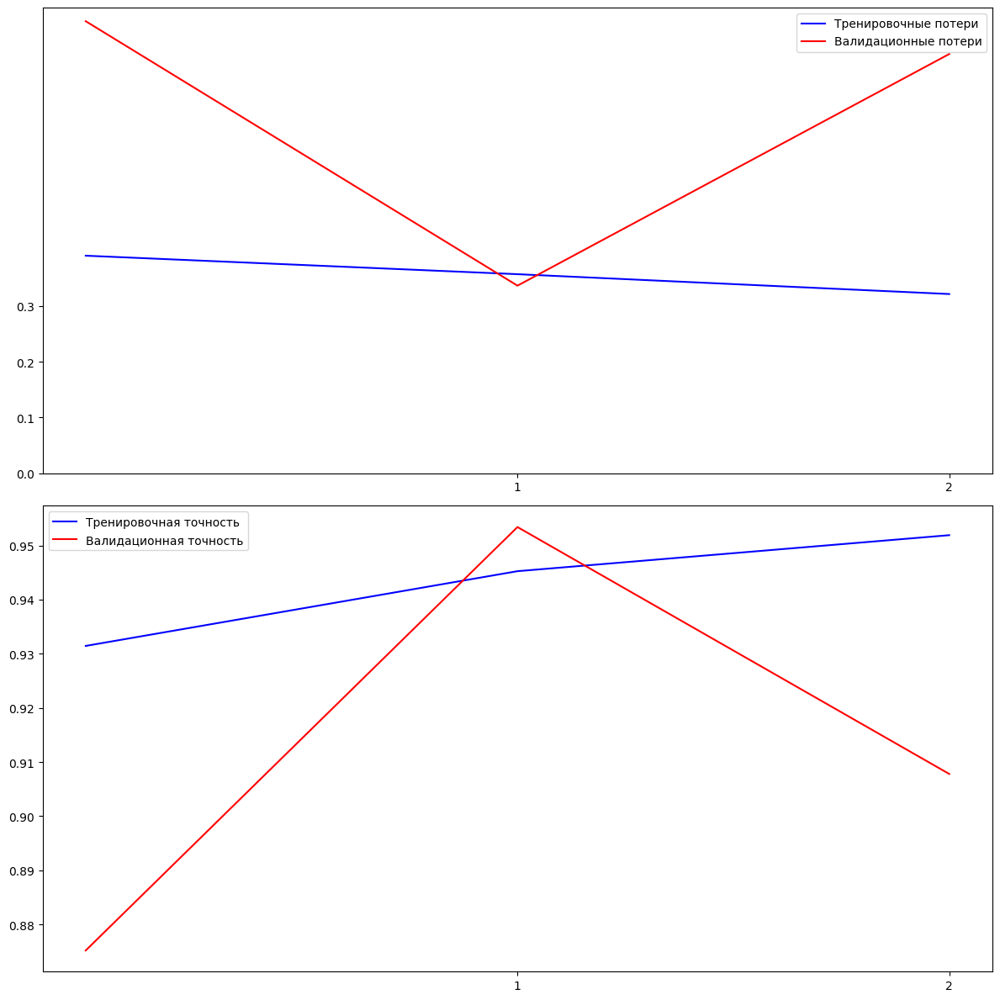

Лучшая валидационная точность для xception:  0.9534000158309937


In [5]:
# Применение функции для модели Xception
base_models = {
    "xception": Xception
}

for model_name, base_model in base_models.items():
    print(f'Обучение модели {model_name}...')
    base_model = base_model(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS))

    create_fit_evaluate_model(base_model, model_name)

1/1 [==============================] - 0s 63ms/step


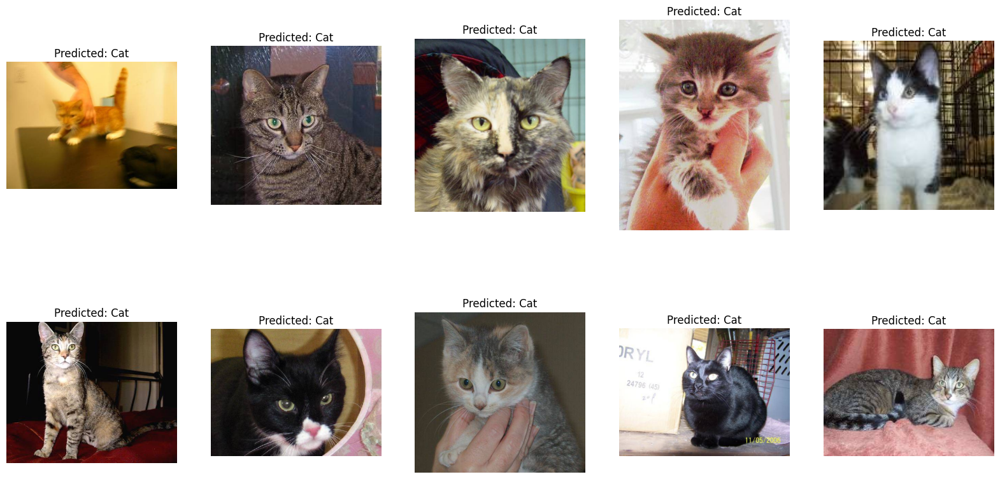

1/1 [==============================] - 0s 54ms/step


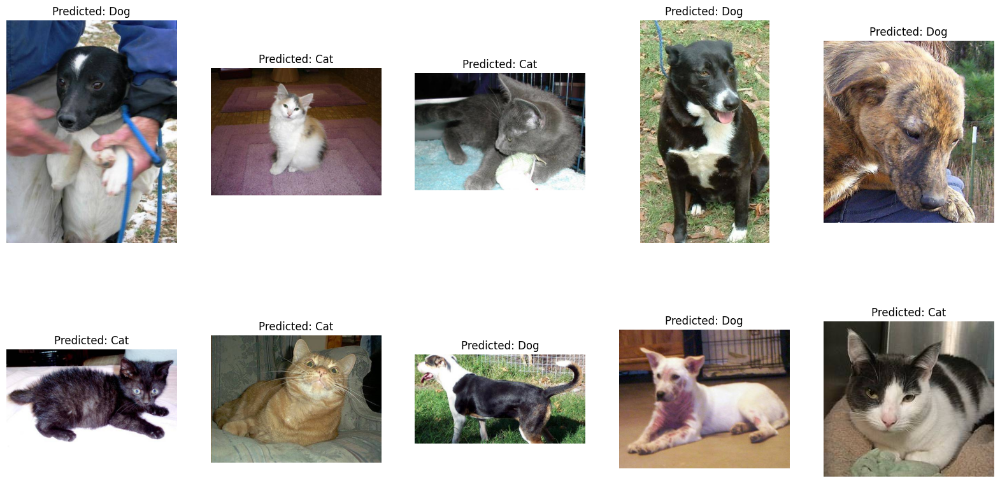

In [10]:
model = load_model('model_xception.h5')

# Директории для изображений
dirs = [train_dir, test_dir]

for dir in dirs:
    plt.figure(figsize=(20, 10))
    for i, img_file in enumerate(os.listdir(dir)[:10]):
        img_path = os.path.join(dir, img_file)
        prediction = predict_image(model, img_path)

        img = mpimg.imread(img_path)
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {"Cat" if prediction < 0.5 else "Dog"}')
    plt.show()

Обучение модели resnet...
Epoch 1/3
1000/1000 [==============================] - 236s 233ms/step - loss: 0.6014 - accuracy: 0.6641 - val_loss: 0.9879 - val_accuracy: 0.2828
Epoch 2/3
1000/1000 [==============================] - 224s 224ms/step - loss: 0.5612 - accuracy: 0.7033 - val_loss: 0.5407 - val_accuracy: 0.7742
Epoch 3/3
1000/1000 [==============================] - 226s 226ms/step - loss: 0.5454 - accuracy: 0.7202 - val_loss: 0.9042 - val_accuracy: 0.4286


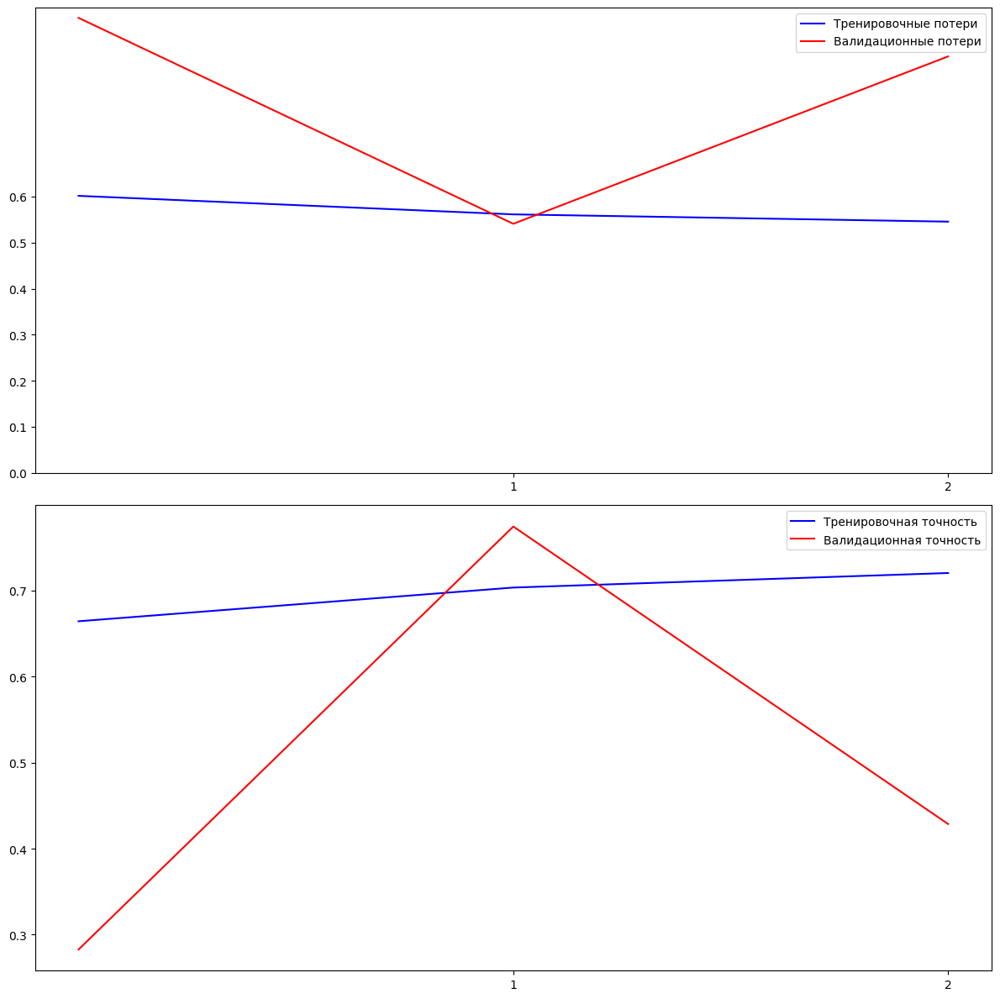

Лучшая валидационная точность для resnet:  0.7742000222206116


In [4]:
# Применение функции для модели resnet
base_models = {
    "resnet": ResNet50
}

for model_name, base_model in base_models.items():
    print(f'Обучение модели {model_name}...')
    base_model = base_model(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS))

    create_fit_evaluate_model(base_model, model_name)

1/1 [==============================] - 0s 52ms/step


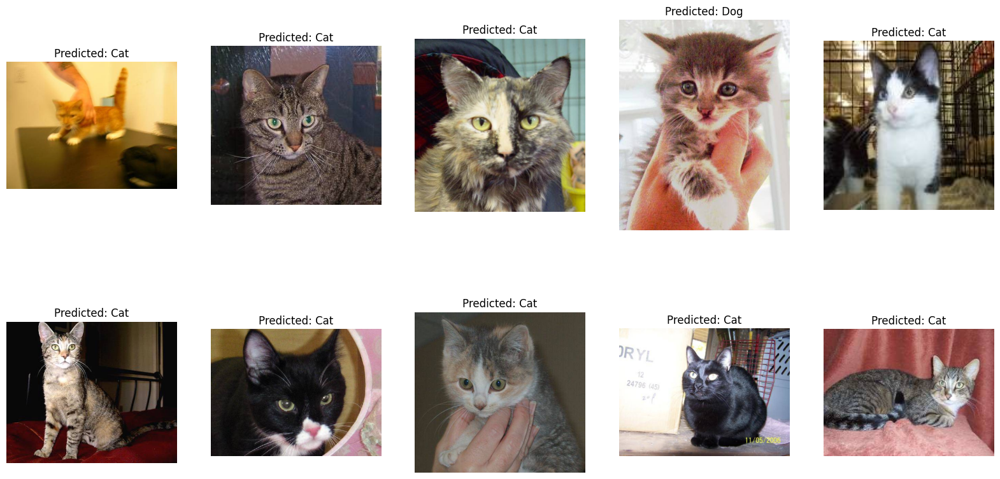

1/1 [==============================] - 0s 52ms/step


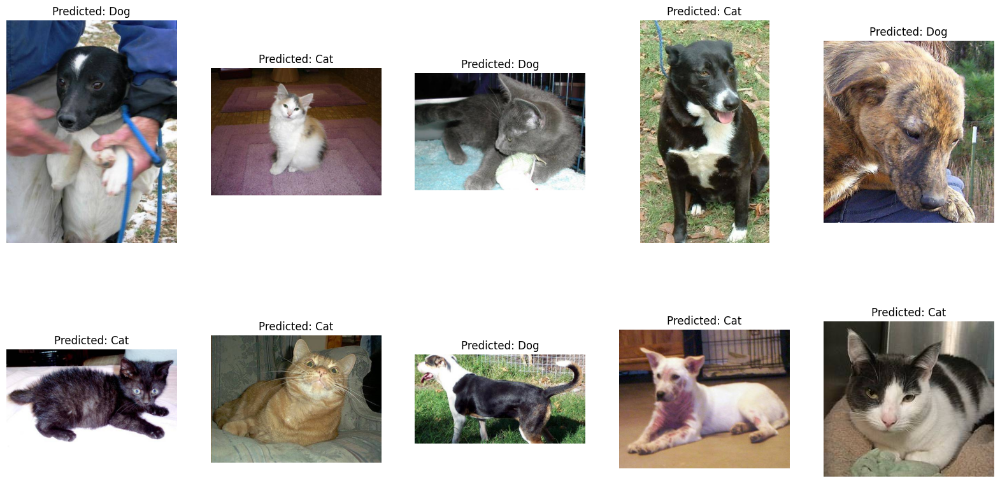

In [11]:
model = load_model('model_resnet.h5')

# Директории для изображений
dirs = [train_dir, test_dir]

for dir in dirs:
    plt.figure(figsize=(20, 10))
    for i, img_file in enumerate(os.listdir(dir)[:10]):
        img_path = os.path.join(dir, img_file)
        prediction = predict_image(model, img_path)

        img = mpimg.imread(img_path)
        plt.subplot(2, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {"Cat" if prediction < 0.5 else "Dog"}')
    plt.show()

**Хотел через цикл сделать, но мощности не хватило**

In [8]:
# Создание словаря базовых моделей
base_models = {
    "vgg16": VGG16,
    "vgg19": VGG19,
    "inception": InceptionV3,
    "xception": Xception,
    "resnet": ResNet50
}

# Применение функции для каждой модели
for model_name, base_model in base_models.items():
    print(f'Обучение модели {model_name}...')
    base_model = base_model(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS))
    create_fit_evaluate_model(base_model, VGG16)

Обучение модели vgg16...
Epoch 1/5
1000/1000 [==============================] - ETA: 0s - loss: 0.2840 - accuracy: 0.8752

KeyboardInterrupt: 